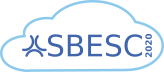 X Brazilian Symposium on Computing Systems Engineering
November 23-27, 2020 - Online

# **Tutorial: Desenvolvendo um Acelerador em FPGA usando PYNQ**
---
*__Sílvio Fernandes__*, Thomas M. Silva, Arlindo Fernandes

Universidade Federal Rural do Semi Árido (UFERSA) - Mossoró/RN - Brasil

silvio@ufersa.edu.br


# Agenda:


1. Introdução
2. Apresentação geral dos objetivos e metodologia de desenvolvimento
3. Algoritmo de transformação de imagem em escala de cinza
4. Implementações do algoritmo de escala de cinza em software
5. Plataforma Ultra96 e o Ambiente de desenvolvimento Xilinx
6. Implementação do acelerador de escala de cinza em hardware
7. Integração do acelerador de escala de cinza na aplicação em software
8. Avaliação de desempenho do acelerador em relação as versões em software

# 1. Introdução

* Lei de Moore -> mais elementos de processamento
* Era do paralelismo
* Arquitetura heterogêneas

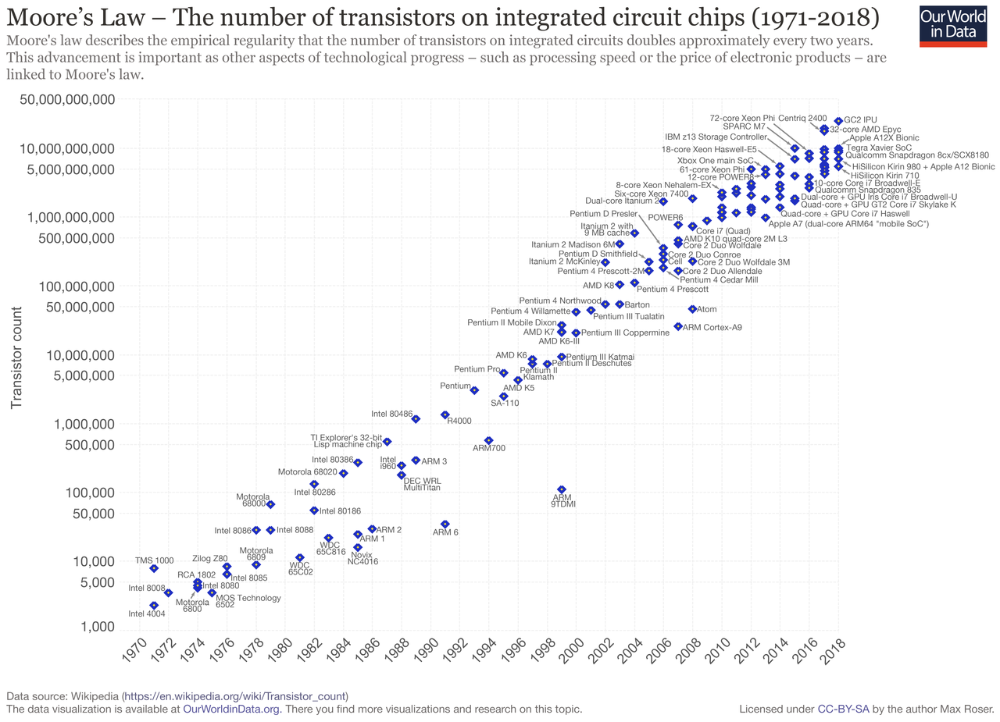

Fonte: https://en.wikipedia.org/wiki/Moore%27s_law

**A era do paralelismo**

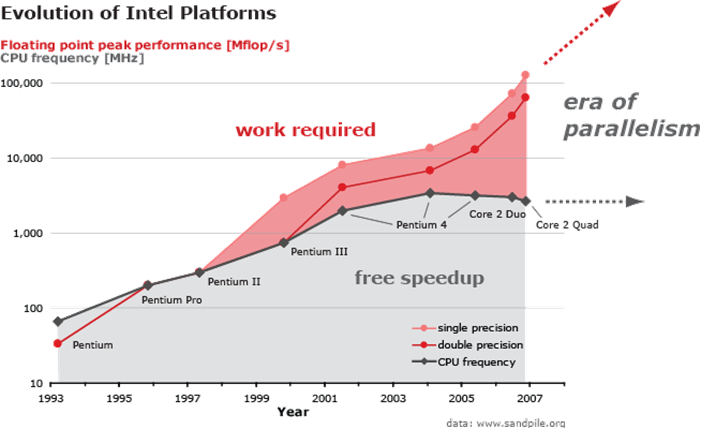

Fonte: http://www.spiral.net/problem.html

**Desempenho e Eficiência de CPU, GPU, FPGA e ASIC**

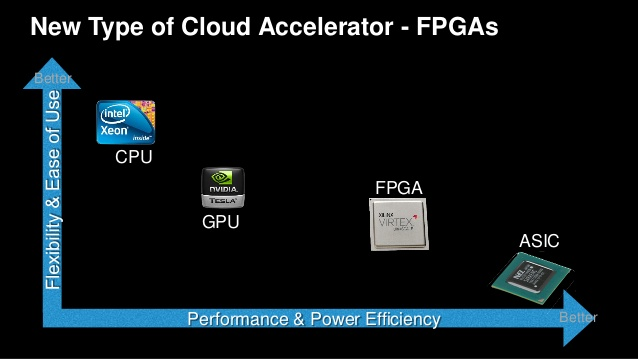

Fonte: https://www.slideshare.net/AmazonWebServices/aws-reinvent-2016-deep-learning-3d-content-rendering-and-massively-parallel-compute-intensive-workloads-in-the-cloud-cmp317

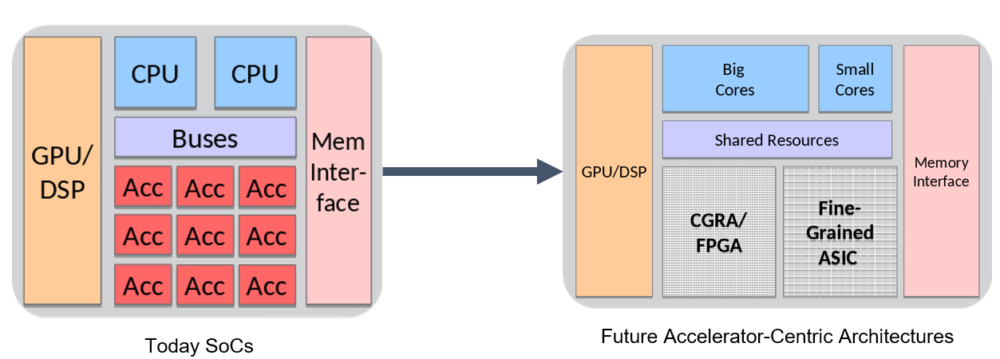

baseado em **Shao, Yakun Sophia, et al. "Aladdin: A pre-rtl, power-performance accelerator simulator enabling large design space exploration of customized architectures." 2014 ACM/IEEE 41st International Symposium on Computer Architecture (ISCA). IEEE, 2014.**

**FPGA (Field Programmable Gate Arrays)**

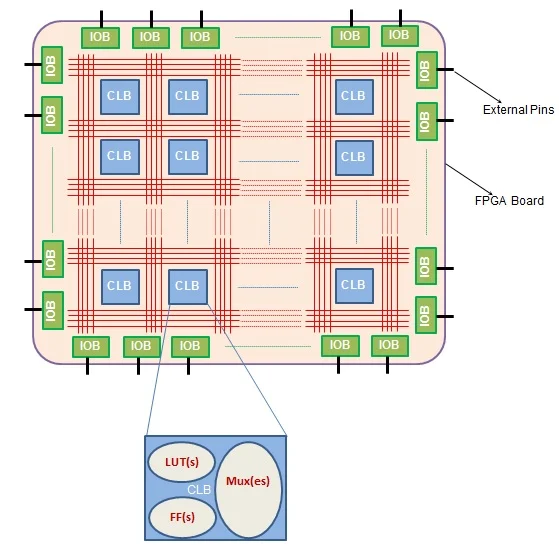

**Fonte:** https://www.allaboutcircuits.com/technical-articles/purpose-and-internal-functionality-of-fpga-look-up-tables/

# 2. Apresentação geral dos objetivos e metodologia de desenvolvimento


**Objetivos:**
* Fluxo de desenvolvimento de um IP (Intellectual Property) em hardware para síntese em um FPGA da Xilinx
* Implementar um acelerador em FPGA voltado para processamento digital de imagens
* Integrar o acelerador a uma aplicação Python usando PYNQ
* Verificar o desempenho da aplicação com acelerador em FPGA

**Metodologia:**
* Desenvolver o algoritmo em Pyhton de forma sequencial
* Desenvolver o algoritmo em Pyhton de forma paralela (vetorizada)
* Desenvolver o acelrador em SystemVerilog
* Integrar o acelerador a aplicação Python usando PYNQ
* Medir o tempo de execução e comparar o desempenho de todas as versões

[Voltar para agenda](#scrollTo=S23Hoau4kmyR&line=3&uniqifier=1)

# 3. Algoritmo de transformação de imagem em escala de cinza

**Processamento Digital de Imagem (PDI)**


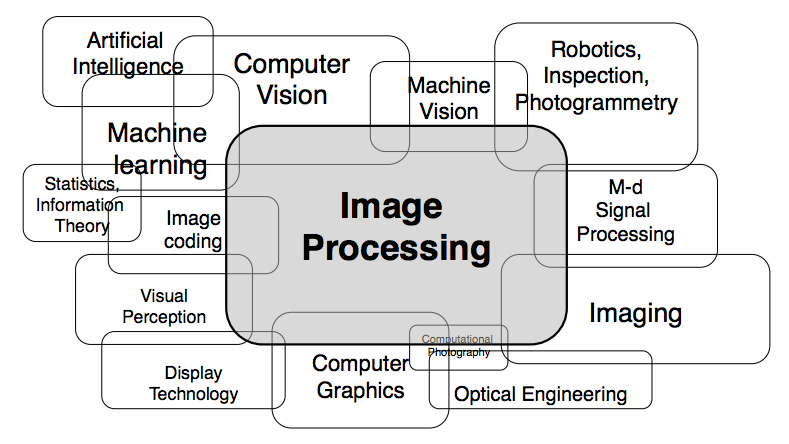

**Principais Etapas do PDI**

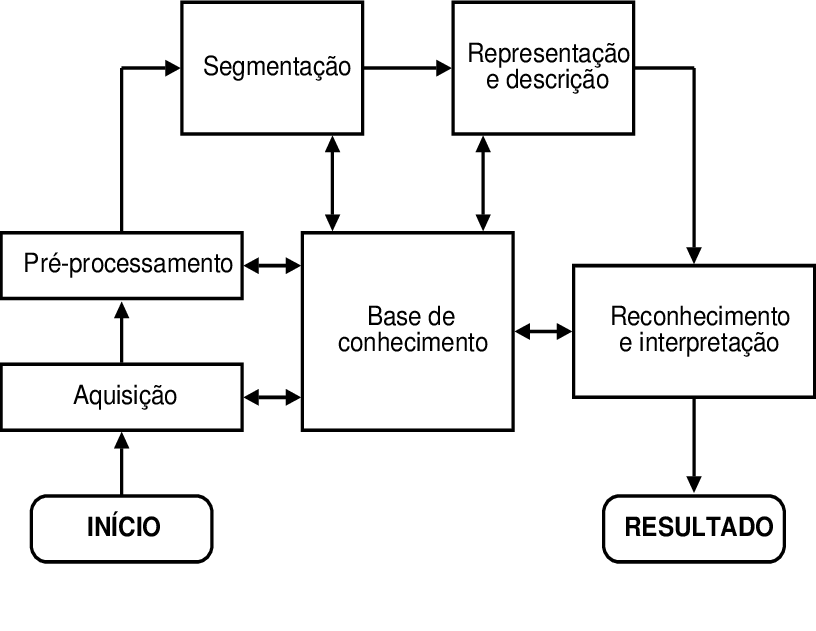

**Imagem: matriz de pixels**

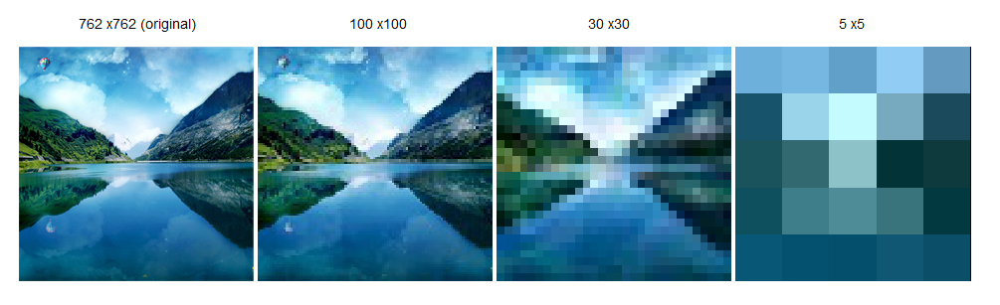

**Imagem no domínio espacial**

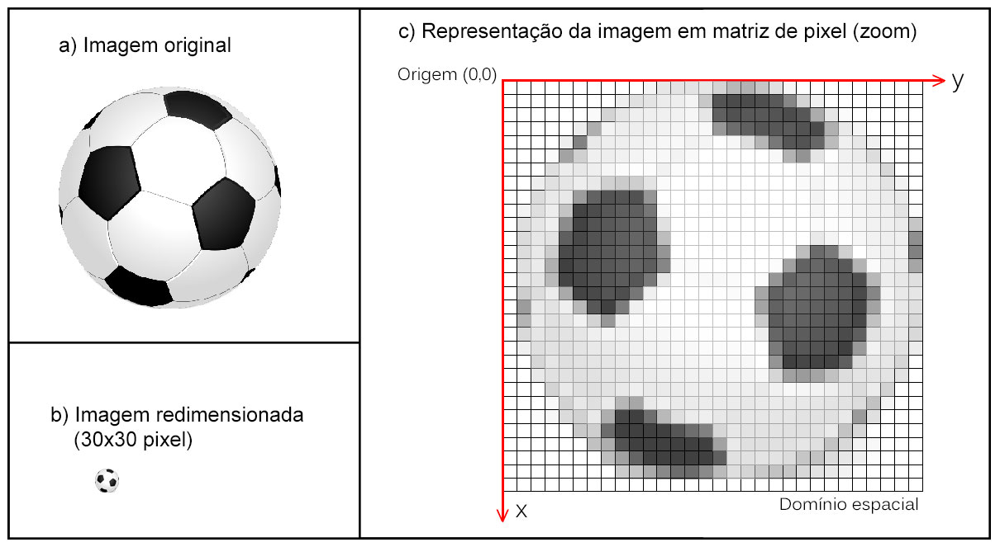

**Codificação RGB**

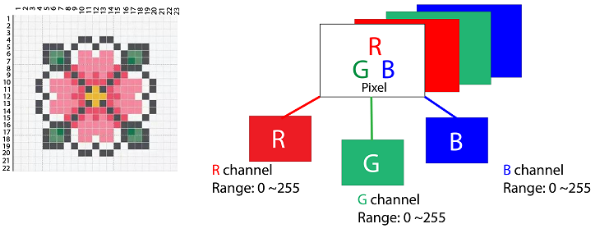

**Pré-processamento - PDI**

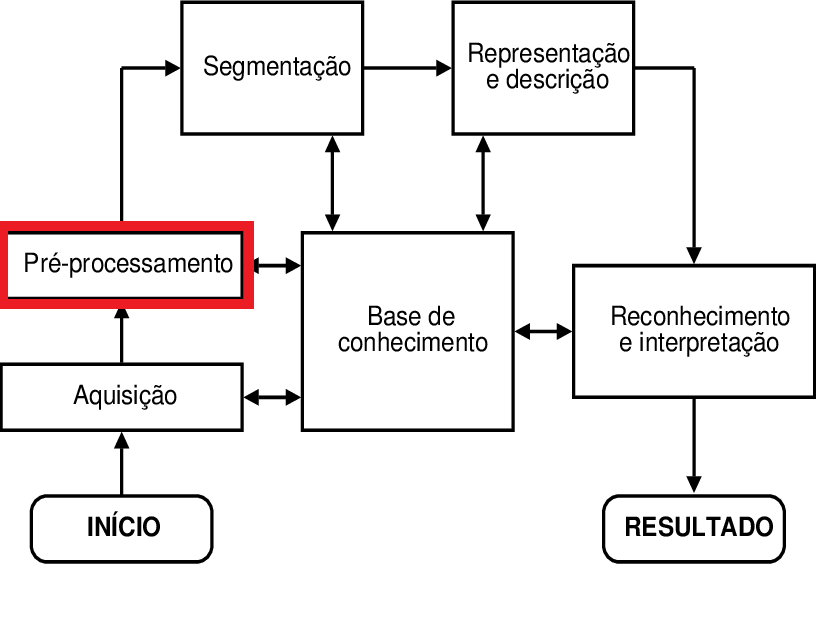

* Eliminar ruídos
* Eliminar informações desnecessárias
* Enfatizar características desejadas

## **Conversão de imagens em escala ou tons de cinza**

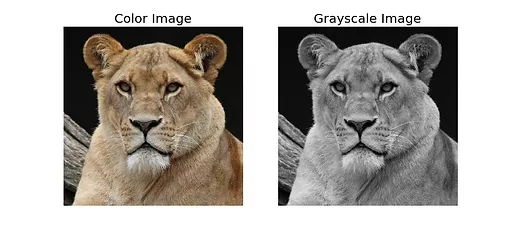


**Algoritmos de conversão de RGB para escala de cinza**

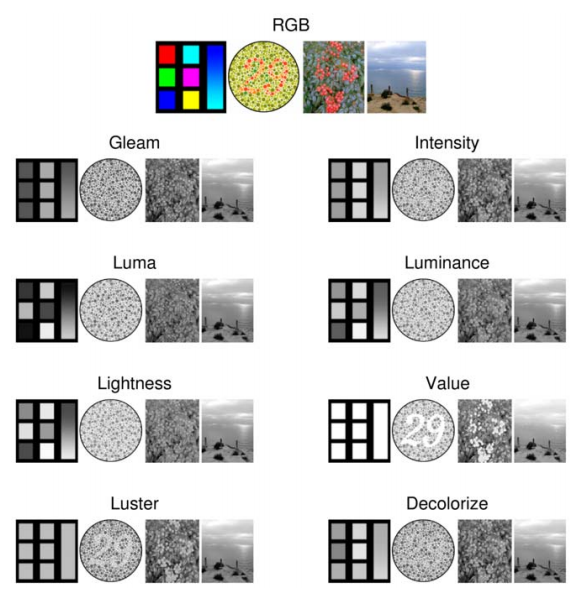


**Fonte:** Kanan, C. and Cottrell, G. W. (2012). Color-to-Grayscale: Does the Method Matter in Image Recognition? PLOS ONE, v. 7, n. 1, p. e29740. 


---


**Codificação YIQ baseada em luminância:**

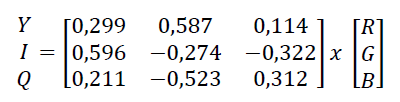

As componentess I e Q são usadas apenas para modulação e decodificação para a TV, então podemos simplificar para:
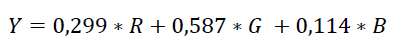

[Voltar para agenda](#scrollTo=S23Hoau4kmyR&line=3&uniqifier=1)

# 4. Implementações do algoritmo de escala de cinza em software

## Implementação em Python
* Sequencial
* Paralelo (vetoriazado)

**Implementação SW Sequencial**

Importando bibliotecas

In [ ]:
from PIL import Image
import numpy as np
import time

Se estiver executando no Google Colab = descomentar
Se estiver executando localmente = comentar 

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')
#file = Image.open("/content/drive/My Drive/Colab Notebooks/imagens/lena.jpg")

Definindo a função GrayScale em software sequencial

In [ ]:
def GrayScaleSW(img, width, height):
  newImageSoftware = Image.new('RGB', (width, height))
  setPixelSoftware = newImageSoftware.load()

  for x in range(width):
    for y in range(height):
      R_converted = img[x,y][0] * 0.299
      G_converted = img[x,y][1] * 0.587
      B_converted = img[x,y][2] * 0.114
      Y = int(R_converted + G_converted + B_converted)
      setPixelSoftware[x, y] = (Y, Y, Y)
  return newImageSoftware

Abrindo a imagem:

Se estiver executando localmente = descomente a próxima célula

Se estiver executando no Google Colab = comente a próxima célula

In [ ]:
file = Image.open("imagens/lena.jpg")

Lendo arquivo da imagem e obtendo largura e altura dela

In [ ]:
img = file.load()
width, height = file.size

file

Chamando a função para converter a imagem em escala de cinza

In [ ]:
result_seq = GrayScaleSW(img, width, height)
result_seq

**Implementação SW Paralelo (vetorizado)**

In [ ]:
def GrayScaleSW_Vec(input_array, width, height):
    constants = np.array([0.299, 0.587, 0.114])
    newImageSoftware = Image.new('RGB', (width, height))
    
    RGB_converted = input_array * constants
    MatY = RGB_converted.sum(axis=2, dtype=np.uint8)        
    GraySW = np.repeat(MatY[:, :, np.newaxis], 3, axis=2)
    
    newImageSoftware = Image.fromarray(GraySW)
    return newImageSoftware

In [ ]:
input_array = np.array(file)
result_vec = GrayScaleSW_Vec(input_array, width, height)
result_vec

In [ ]:
start_time = time.time()
GrayScaleSW(img, width, height)
stop_time = time.time()

seq_time = stop_time - start_time

In [ ]:
start_time = time.time()
GrayScaleSW_Vec(input_array, width, height)
stop_time = time.time()

vec_time = stop_time - start_time

In [ ]:
print(seq_time)
print(vec_time)

print("Solução vetorial é " + str(seq_time/vec_time) + " vezes mais rápida")

# 5. Plataforma Ultra96 e o Ambiente de desenvolvimento Xilinx

## Plataforma Ultra96

* Platform Avnet Ultra96
  * SoC Xilinx Zynq UltraScale+ MPSoC ZU3EG A484
  * 2 GB RAM LPDDR4
  * Storage 16 GB microSD
  * Wi-Fi/Bluetooth 4.2 (BLE)
  * OS Support: Linux


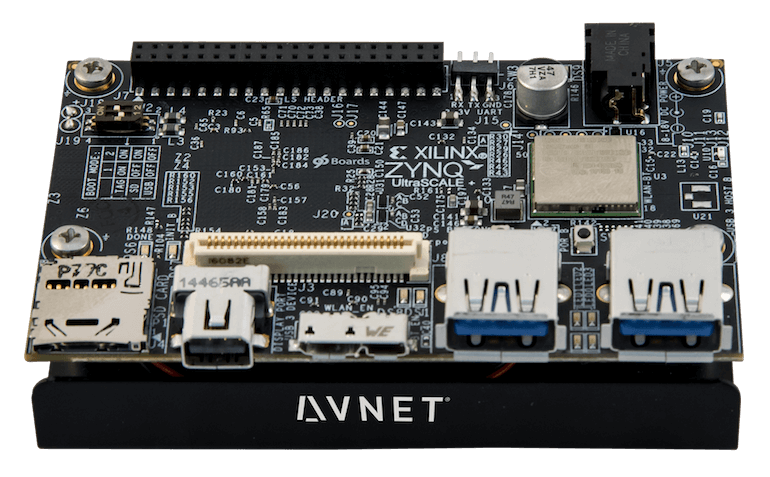 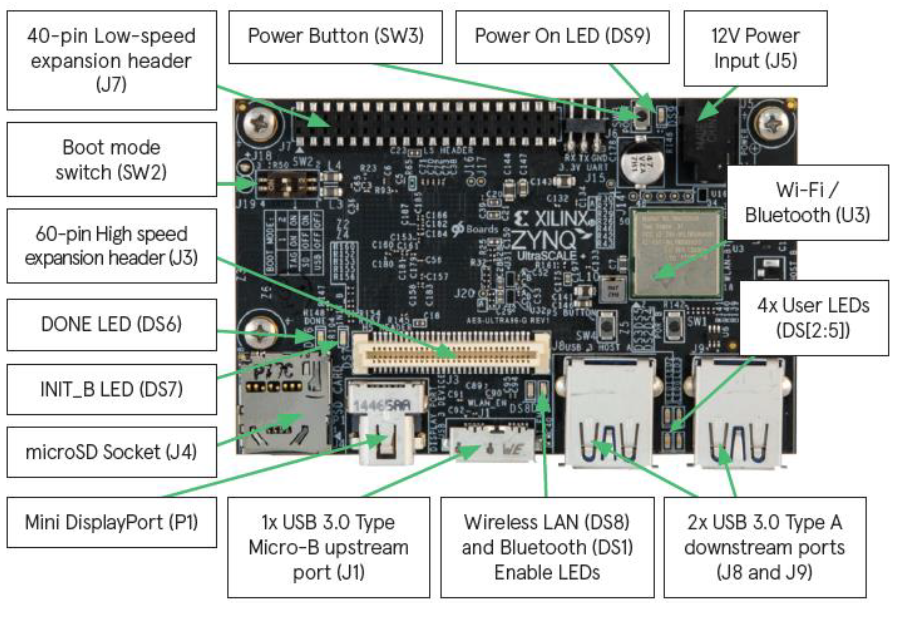


**Sensors96b Overlay e Sensors96 Mezzanine board**

*Sensor96 board* é uma placa mezanino que fornece interfaces que podem ser usadas para conectar sensores ao conector de 40 pinos na Ultra96

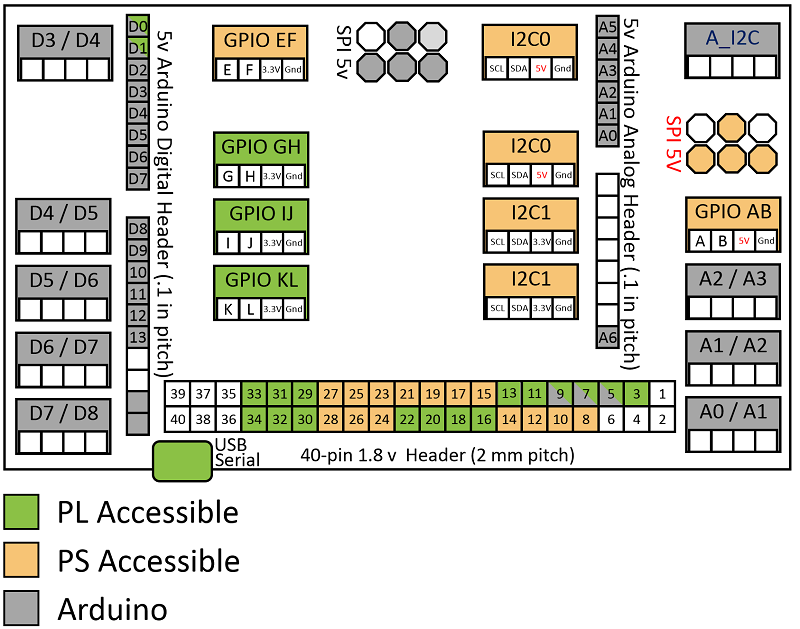

**Fonte: **https://ultra96-pynq.readthedocs.io/en/latest/sensors96b_overlay.html

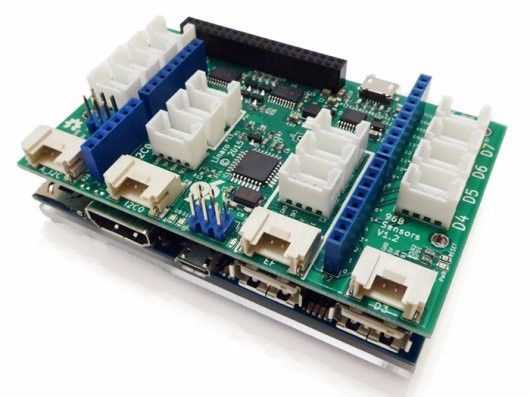

Grove starter kit for 96boards

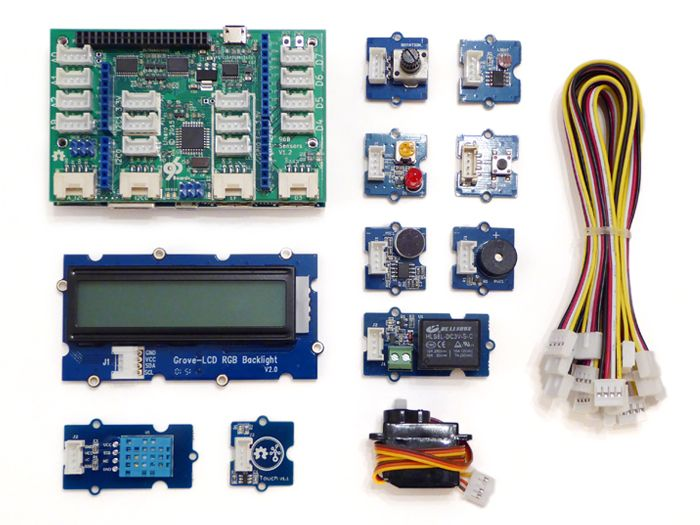

**Zynq® UltraScale+™ MPSoC**

* Processor System (PS)
  * Quad-core ARM Cortex-A53 MPCore with CoreSight; NEON & Single/Double Precision Floating Point; 32KB/32KB L1 Cache, 1MB L2 Cache
  * Dual-core ARM Cortex-R5 with CoreSight; Single/Double Precision Floating Point; 32KB/32KB L1 Cache, and TCM
  * GPU ARM Mali-400 MP2; 64KB L2 Cache
* Programmable Logic (PL)
  * System Logic Cells: 154350
  * CLB Flip-Flops: 141120
  * CLB LUTs: 70560
  * Distributed RAM (Mb): 1,8
  * Block RAM Blocks: 216
  * Block RAM (Mb): 7,6
  * DSP Slices: 360


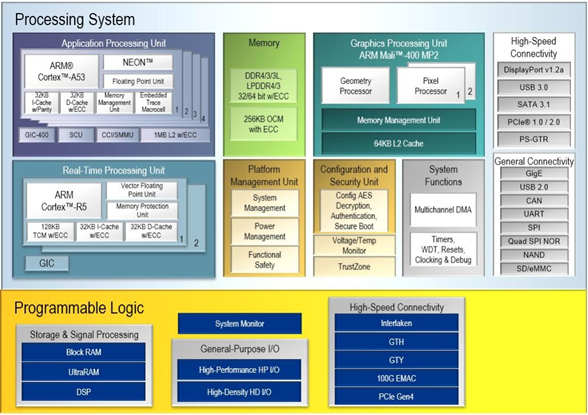

**Fonte:** https://www.xilinx.com/products/silicon-devices/soc/zynq-ultrascale-mpsoc.html

**Comunicação entre PS e PL**

* Memória compartilhada entre os cores de CPU e FPGA
* Comunicação usa protocolo AXI
  * AXI-lite (memória mapeada em registrador)
  * AXI-4 (full)
  * AXI-Stream

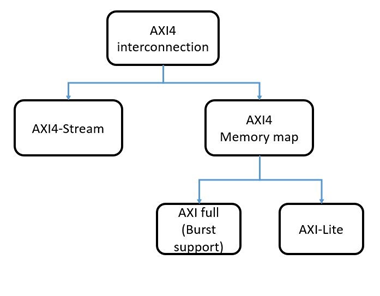

Fonte: https://www.aldec.com/en/company/blog/145--demystifying-axi-interconnection-for-zynq-soc-fpga

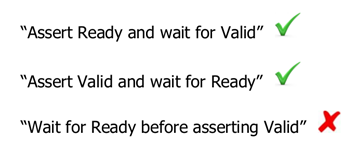

**Fonte:** https://cas.tudelft.nl/Education/courses/et4351/SILICA_Xilinx_Designing_a_custom_axi_slave_rev1.pdf

**Desenvolvimento para Ultra96**
* Baremetal
* Suporte Sistema Operacional
  * PetaLinux
  * Linaro
  * **PYNQ**

**Documentação Ultra96:** http://zedboard.org/support/documentation/24166

**Tutoriais Ultra96:** http://www.ultra96.org/support/design/24166/156

## Ambiente de desenvolvimento Xilinx Vivado
1. Desenvolvimento de projeto voltado para uma placa específica
2. Desenvolvimento do IP
3. Integração automática com SoC da placa
4. Síntese, implementação e geração do bitsream para o FPGA

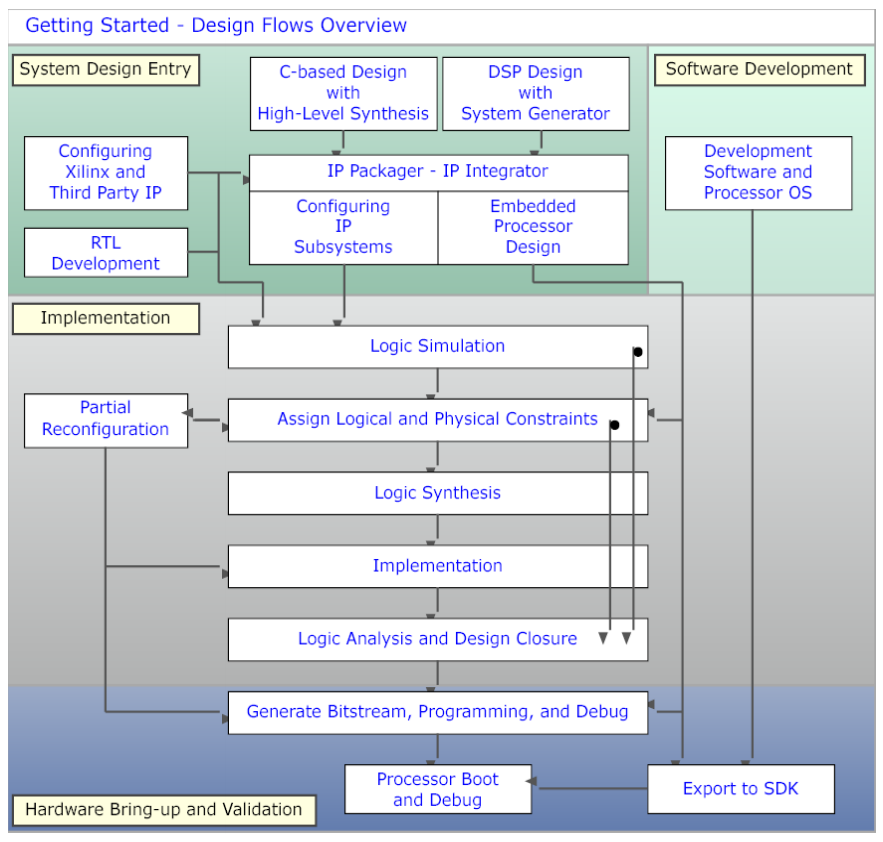

**Fonte:** https://www.xilinx.com/support/documentation/sw_manuals/xilinx2015_1/ug892-vivado-design-flows-overview.pdf 

**Desenvolvimento de projeto voltada para Ultra96**
* Baixar e instalar os *Board Definition Files* conforme [Tutorial](http://zedboard.org/sites/default/files/documentations/Installing-Board-Definition-Files_v1_0.pdf)
* Criação do projeto seguindo [*Tutorial 01 Build a ZU+ MPSoC Hardware Platform*](http://www.ultra96.org/support/design/24166/156)

# 6. Implementação do acelerador de escala de cinza em hardware

**Diagrama de blocos da solução heterogênea (GrayScale Accel) na Ultra96**


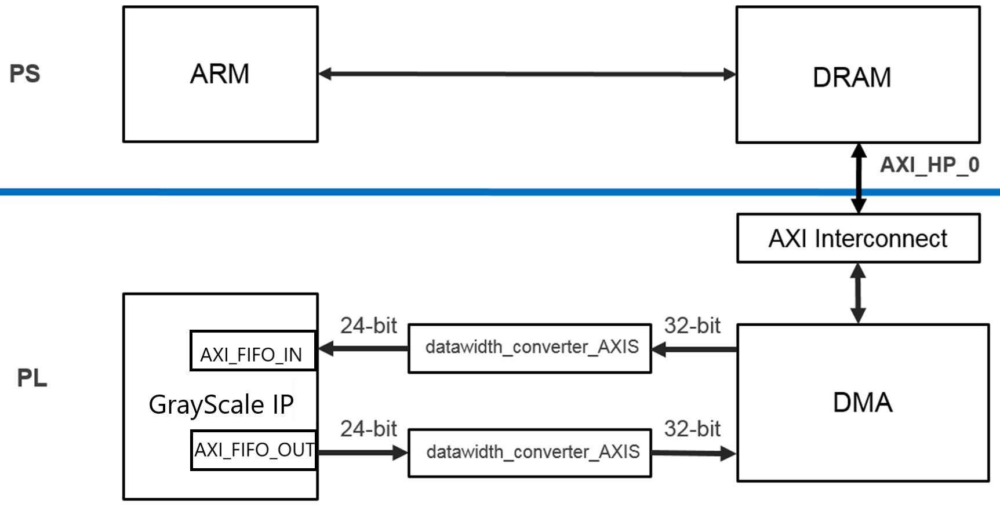

**Criar o bloco GrayScale IP em nível RTL usando SystemVerilog no Vivado**

Exemplos: 
* [Tutorial: Creating a hardware design for PYNQ](https://discuss.pynq.io/t/tutorial-creating-a-hardware-design-for-pynq/145)
* [PYNQ Workshop](https://github.com/Xilinx/PYNQ_Workshop)

**Resultados de síntese para o FPGA**

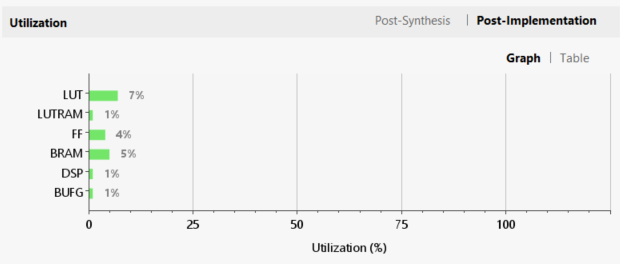

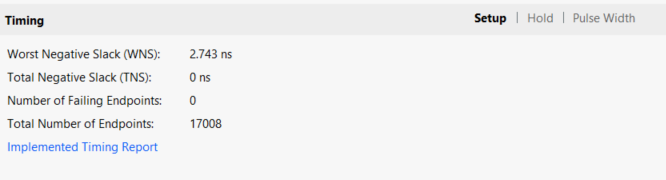

**Gerar o bitstream e exportar os arquivos para configuração do FPGA e comunicação com PYNQ**

* Todos os arquivos exportados devem ter o mesmo nome, mudando apenas a extensão
  * Bitstream (.bit)
      * Pode ser exportado para qualquer diretório no Vivado usando "File -> Export -> Export Bitstream File"
  * Metadados do projeto Vivado (.tcl)
      * Se encontra no diretório do projeto no caminho "NOME-PROJETO.srcs\sources_1\bd\design_1\hw_handoff"
  * IPs disponíveis e informações de mapeamento de memória, periféricos, entre outros, para as aplicações (.hwh)
      * Se encontra no diretório do projeto no seguinte caminho "NOME-PROJETO.srcs\sources_1\bd\design_1\hw_handoff"




# 7. Integração do acelerador de escala de cinza na aplicação em software

### PYNQ

* PYNQ é um acrônimo para Python Productivity for Zynq
* Projeto open-source para as plataformas Zynq, Zynq UltraScale+, Zynq RFSoC, Alveo e AWS-F1 
* Funde a produtividade do Python com a aceleração fornecida pela lógica programável no Zynq ou Zynq MPSoC

**Tecnologias envolvidas**

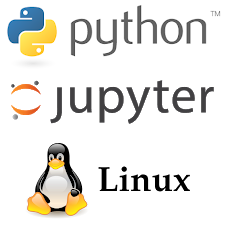
**Fonte:** http://www.pynq.io/home.html

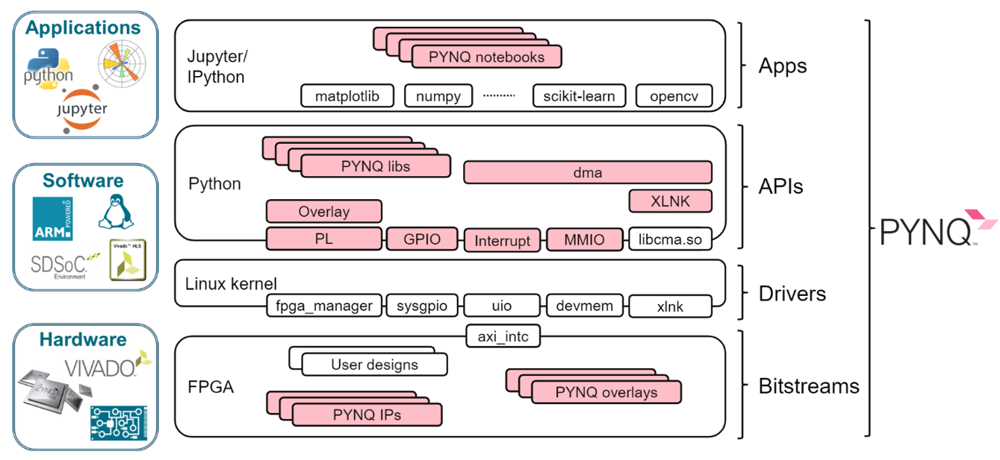
**Fonte:** http://www.pynq.io/home.html

**[Ultra96-PYNQ’s documentation](https://ultra96-pynq.readthedocs.io/en/latest/)**

**Preparar a placa Ultra96**

* [Baixar a do SO com o PYNQ](http://www.ultra96.org/support/design/24166/156)
* [Instalar a imagem do SO em um *micro SD card* e conectá-lo a placa](https://pynq.readthedocs.io/en/latest/appendix.html#writing-the-sd-card)
* Ajustar os jumpers da placa para realizar o boot pelo cartão SD
* Ligar a placa e conectar o computador a ela por
  * Wifi gerado por ela cujo nome segue o padrão pynq_XXXXXXX (onde XXXX é o MAC da placa)
  * Cabo microUSB

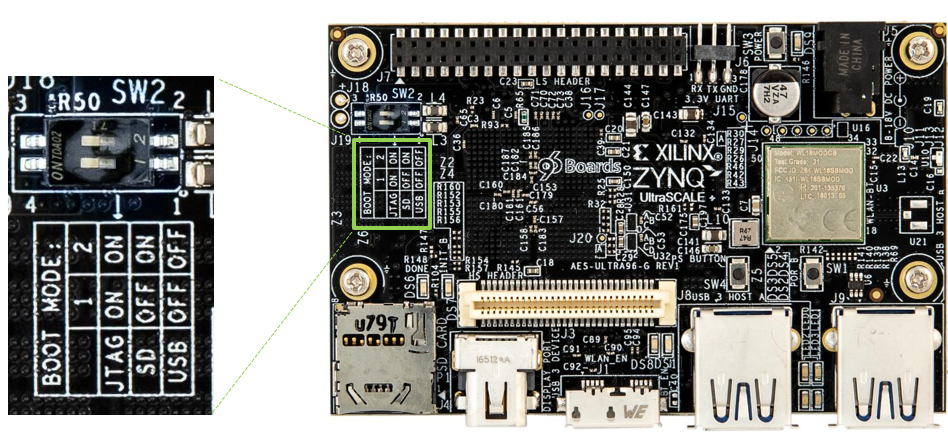

**Acessando a placa**
* Por meio de um navegador, usar um dos endereços, dependendo da forma de conexão
  * USB: http://192.168.3.1
  * WiFi access point: http://192.168.2.1
* Por padrão o login e senha é **xilinx**

**Enviar os arquivos exportados no Vivado para a placa**
* Via SCP
* Ou mapeando unidade de rede

## Implementação do GreyScale Accel

**Executar as próximas células na placa**

Importando as bibliotecas

In [ ]:
from PIL import Image
import numpy as np
import time

import pynq.lib.dma
from pynq import Overlay
from pynq import Xlnk

**Testando o acelerador em FPGA**

Criando um Overlay para carregar o bitstream para o FPGA

In [ ]:
overlay = Overlay('./bitstream/design_1.bit')

Vamos descobrir quais IPs são listados neste Overlay

In [ ]:
overlay.ip_dict

Vamos carregar o objeto DMA para transferir de/para o FPGA

In [ ]:
dma = overlay.axi_dma_0

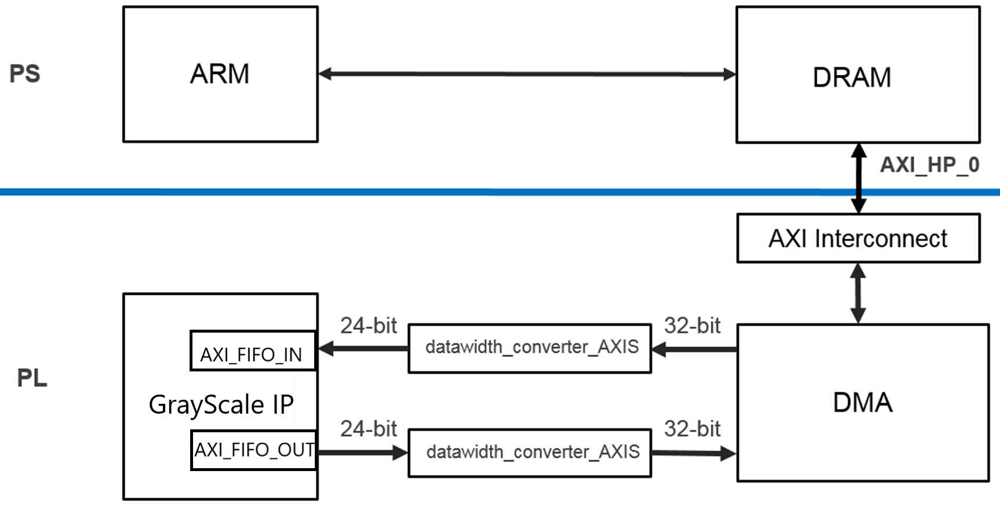

Abrindo a imagem e carregando-a para um array numpy

In [ ]:
file = Image.open("imagens/lena.jpg")
width, height = file.size
input_array = np.array(file)
file

Criar os buffers para envio da imagem RGB e recebimento da imagem YIQ, com 24 bits de largura

In [ ]:
xlnk = Xlnk()
in_buffer = xlnk.cma_array(shape=(height, width, 3), dtype=np.uint8, cacheable=1)
out_buffer = xlnk.cma_array(shape=(height, width, 3), dtype=np.uint8, cacheable=1)

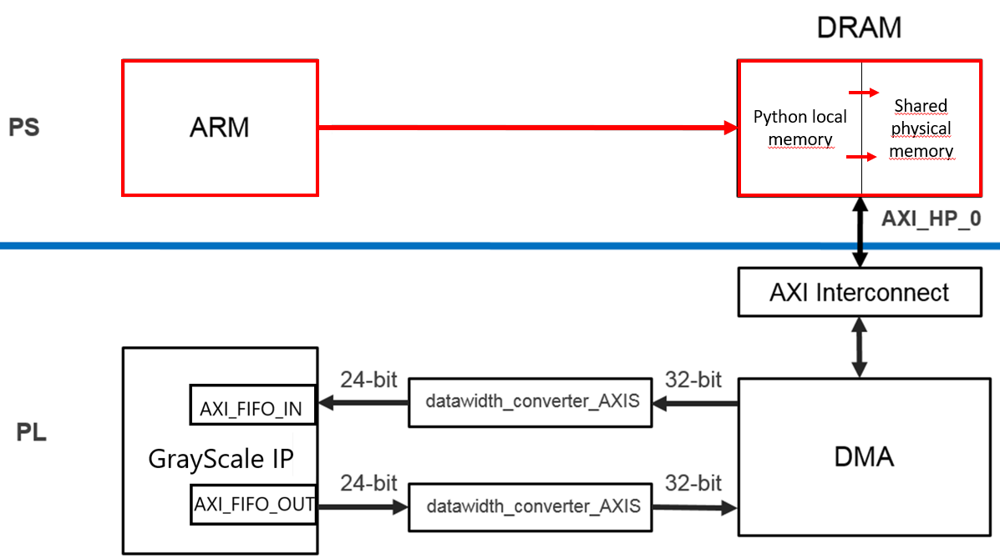

Copiandos os dados da imagem colorida para o buffer de entrada

In [ ]:
in_buffer[0:width*height*3] = input_array

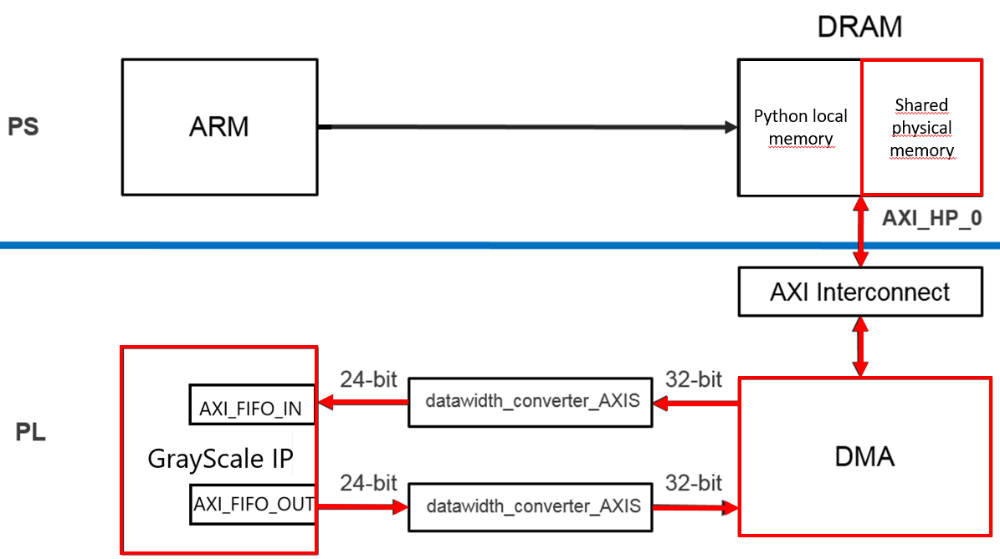

Comunicação com o DMA - enviando imagem colorida e recebendo em tons de cinza

In [ ]:
#Envio da imagem RGB pelo DMA
dma.sendchannel.transfer(in_buffer)
dma.recvchannel.transfer(out_buffer)
dma.sendchannel.wait()
dma.recvchannel.wait()
#Recebe imagem em cinza pelo DMA como YYY nas posições RGB

Salvando a imagem recebida em formato RGB

In [ ]:
newImage = Image.new('RGB', (width, height))        
newImage = Image.fromarray(out_buffer)

Imagem recebida

In [ ]:
newImage

**Podemos encapsular tudo em uma função que estabelece a comunicação com o acelerador no FPGA**

In [ ]:
def GrayScaleHW(input_array, width, height):
        xlnk = Xlnk()
        in_buffer = xlnk.cma_array(shape=(height, width, 3), dtype=np.uint8, cacheable=1)
        out_buffer = xlnk.cma_array(shape=(height, width, 3), dtype=np.uint8, cacheable=1)
        in_buffer[0:width*height*3] = input_array
        dma = overlay.axi_dma_0
        
        #Envio da imagem RGB pelo DMA
        dma.sendchannel.transfer(in_buffer)
        dma.recvchannel.transfer(out_buffer)
        dma.sendchannel.wait()
        dma.recvchannel.wait()
        #Recebe imagem em cinza pelo DMA como YYY nas posições RGB

        newImage = Image.new('RGB', (width, height))        
        newImage = Image.fromarray(out_buffer)
        return newImage

Carregando a imagem original novamente

In [ ]:
file = Image.open("imagens/lena.jpg")
width, height = file.size
input_array = np.array(file)
file

Testando a função GrayScaleHW

In [ ]:
result_hw = GrayScaleHW(input_array, width, height)
result_hw

# 8. Avaliação de desempenho do acelerador em relação as versões em software

### Usando uma mesma imagem - com 3 resoluções diferentes:

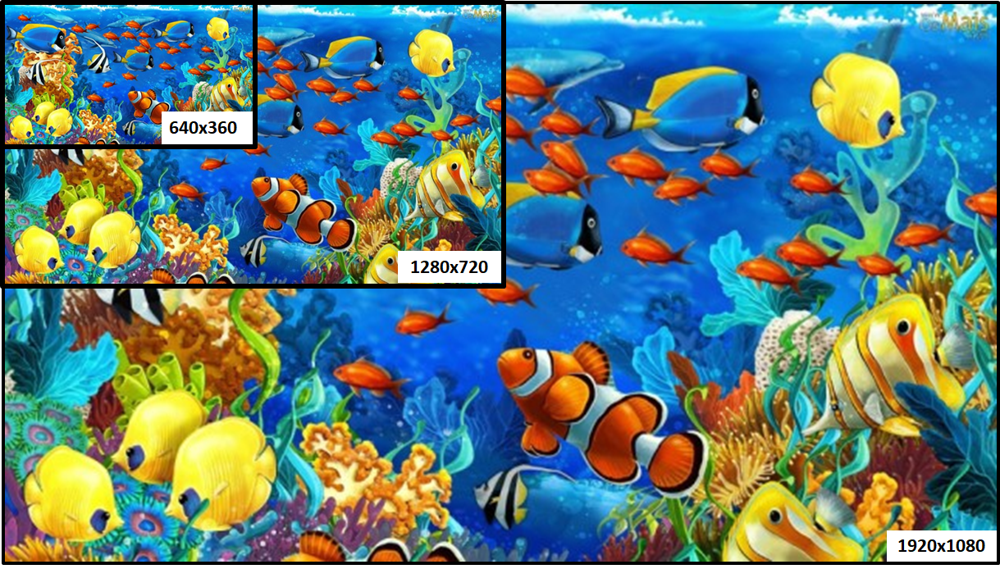

**Executando 10 vezes em cada versão:**
1. Software Sequencial (SW-Seq)
2. Software Paralelo/vetorizado (SW-Vec)
3. Acelerador em Hardware (HW)

Importando as bibliotecas

In [ ]:
from PIL import Image
import numpy as np
import time

import matplotlib.pyplot as plt
#import seaborn as sb
import pandas as pd

Definição das funções de cada versão

In [ ]:
def GrayScaleSW(img, width, height):
  newImageSoftware = Image.new('RGB', (width, height))
  setPixelSoftware = newImageSoftware.load()

  for x in range(width):
    for y in range(height):
      R_converted = img[x,y][0] * 0.299
      G_converted = img[x,y][1] * 0.587
      B_converted = img[x,y][2] * 0.114
      Y = int(R_converted + G_converted + B_converted)
      setPixelSoftware[x, y] = (Y, Y, Y)
  return newImageSoftware

In [ ]:
def GrayScaleSW_Vec(input_array, width, height):
    constants = np.array([0.299, 0.587, 0.114])
    newImageSoftware = Image.new('RGB', (width, height))
    
    RGB_converted = input_array * constants
    MatY = RGB_converted.sum(axis=2, dtype=np.uint8)        
    GraySW = np.repeat(MatY[:, :, np.newaxis], 3, axis=2)
    
    newImageSoftware = Image.fromarray(GraySW)
    return newImageSoftware

In [ ]:
def GrayScaleHW(input_array, width, height):
        xlnk = Xlnk()
        in_buffer = xlnk.cma_array(shape=(height, width, 3), dtype=np.uint8, cacheable=1)
        out_buffer = xlnk.cma_array(shape=(height, width, 3), dtype=np.uint8, cacheable=1)
        in_buffer[0:width*height*3] = input_array
        dma = overlay.axi_dma_0
        
        #Envio da imagem RGB pelo DMA
        dma.sendchannel.transfer(in_buffer)
        dma.recvchannel.transfer(out_buffer)
        dma.sendchannel.wait()
        dma.recvchannel.wait()
        #Recebe imagem em cinza pelo DMA como YYY nas posições RGB

        newImage = Image.new('RGB', (width, height))        
        newImage = Image.fromarray(out_buffer)
        return newImage

Abrindo as imagens coloridas nas 3 resoluções

In [ ]:
resolution = pd.Series(["640x360", "1280x720", "1920x1080"])
img = []
width = []
height = []
input_array = []

for i in range(3):
    file = Image.open("imagens/imagem-"+resolution[i]+".jpg")
    img.append(file.load())
    width.append(file.size[0])
    height.append(file.size[1])
    input_array.append(np.array(file))

Criar uma estrutura de dados para guardar os tempos de execução

In [ ]:
df_execution_time = pd.DataFrame(columns=['HW', 'SW-Vec', 'SW-Seq'])
df_execution_time['Resolution'] = ''

Executando cada versão n vezes para cada imagem (definido na variável 'bench_length')

In [ ]:
bench_length = 10
index = 0

#For each resolutions bench_length times
for i in range(len(resolution)):
    for test in range(bench_length):
        start_time = time.time()
        #result_HW = GrayScaleHW(input_array[i], width[i], height[i])
        stop_time = time.time()
        execution_time_HW = stop_time-start_time        

        start_time = time.time()
        result_SW_Vec = GrayScaleSW_Vec(input_array[i], width[i], height[i])
        stop_time = time.time()
        execution_time_SW_Vec = stop_time-start_time

        start_time = time.time()
        result_SW_Seq = GrayScaleSW(img[i], width[i], height[i])    
        stop_time = time.time()
        execution_time_SW_Seq = stop_time-start_time
        
        exec_dict = {'HW':execution_time_HW, 'SW-Vec':execution_time_SW_Vec, 'SW-Seq': execution_time_SW_Seq, 'Resolution': resolution[i]}
        df_execution_time.loc[index] = exec_dict
        index = index + 1

Vamos ver os dados em um gráfico

In [ ]:
#fig, ax = plt.subplots(figsize=(15,8))
#fig.suptitle("Tempo de Execução para cada versão ", fontdict={'fontsize':15})

#subplot(2,3,1)
#sb.swarmplot(x='Resolution', y='HW', data=df_execution_time)

#subplot(2,3,2)
#sb.swarmplot(x='Resolution', y='SW-Vec', data=df_execution_time)

#subplot(2,3,3)
#sb.swarmplot(x='Resolution', y='SW-Seq', data=df_execution_time)


#plt.show()

In [ ]:
plt.bar(df_execution_time['Resolution'], df_execution_time['HW'], color='green') 

In [ ]:
plt.bar(df_execution_time['Resolution'], df_execution_time['SW-Vec']) 

In [ ]:
plt.bar(df_execution_time['Resolution'], df_execution_time['SW-Seq'], color='red')

In [ ]:
std_exec_times = pd.DataFrame(columns=['Resolution','HW', 'SW-Vec', 'SW-Seq'])
for i in range(len(resolution)):
    HW = df_execution_time.query(f"Resolution == '{resolution[i]}'")['HW'].std()
    SW_Vec = df_execution_time.query(f"Resolution == '{resolution[i]}'")['SW-Vec'].std()
    SW_Seq = df_execution_time.query(f"Resolution == '{resolution[i]}'")['SW-Seq'].std()
    
    std_exec_times.loc[i] = {'Resolution':resolution[i], 'HW':HW, 'SW-Vec':SW_Vec, 'SW-Seq': SW_Seq}

std_exec_times.set_index('Resolution', inplace = True)
std_exec_times.plot()


In [ ]:
mean_exec_times = pd.DataFrame(columns=['Resolution','HW', 'SW-Vec', 'SW-Seq'])
for i in range(len(resolution)):
    HW = df_execution_time.query(f"Resolution == '{resolution[i]}'")['HW'].mean()
    SW_Vec = df_execution_time.query(f"Resolution == '{resolution[i]}'")['SW-Vec'].mean()
    SW_Seq = df_execution_time.query(f"Resolution == '{resolution[i]}'")['SW-Seq'].mean()
    
    mean_exec_times.loc[i] = {'Resolution':resolution[i], 'HW':HW, 'SW-Vec':SW_Vec, 'SW-Seq': SW_Seq}

mean_exec_times.set_index('Resolution', inplace = True)
mean_exec_times

In [ ]:
#largura da barras
barWidth = 0.25
plt.figure(figsize=(12,5))

#posicao das barras
r1 = np.arange(len(mean_exec_times))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

plt.bar(r1, mean_exec_times['HW'], color='b', width=barWidth, label="HW")
plt.bar(r2, mean_exec_times['SW-Vec'], color='g', width=barWidth, label="SW Vec")
plt.bar(r3, mean_exec_times['SW-Seq'], color='r', width=barWidth,label="SW Seq")


#configuraçãoes do grafico
plt.title('Tempo Médio de Execução', fontsize =15)
plt.xlabel("Resolução")
plt.xticks([x + barWidth for x in range(len(resolution))], resolution)

plt.legend()
plt.show()

Podemos comparar a semelhança das imagens erro médio quadrádico (MSE)

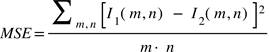

In [ ]:
def MSE(original, other):
    difference = np.subtract(original, other)
    MSE = np.square(difference).mean()
    return MSE

In [ ]:
print("##### Comparativo da qualidade das imagens")
print(f"Hardware x Software Seq: {MSE(mean_exec_times['HW'], mean_exec_times['SW-Seq'])}")
print(f"Hardware x Software Vec: {MSE(mean_exec_times['HW'], mean_exec_times['SW-Vec'])}")
print(f"Software Seq x Software Vec: {MSE(mean_exec_times['SW-Seq'], mean_exec_times['SW-Vec'])}")

Este projeto está disponível em:

https://github.com/SilvioRFernandes/grayscale-accel

**Agradecimentos**

[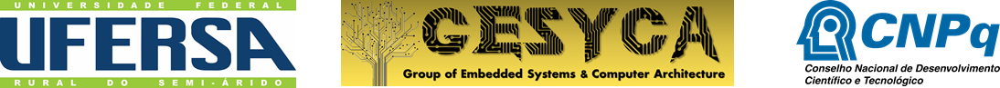](http://gesyca.ufersa.edu.br/)
Universidade Federal Rural do Seminárido  &ensp; &ensp; &ensp; &ensp; &ensp; Group of Embedded System and Computer Architecture é um grupo

**Desenvolvendo um Acelerador em FPGA usando PYNQ**

Sílvio Fernandes, Thomas M. Silva, Arlindo Fernandes